### Imports and aligning the Datasets

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
pd.options.mode.chained_assignment = None
from datetime import date
from scipy.stats import permutation_test

In [2]:
us_df = pd.read_csv('csv/us_cleaned_health_data.csv')
pre_df = pd.read_csv('csv/NS_sep-dec2020.csv')
df = pd.read_csv('csv/NS_jan-dec2021.csv')
post_df = pd.read_csv('csv/NS_jan2022-mar2022.csv')
daily_articles = pd.read_csv('csv/num_daily_articles.csv')
df = pd.concat((pre_df, df, post_df),axis=0)
df.drop('Unnamed: 0', axis=1, inplace=True)

reg_df = pd.read_csv('csv/NS_regular_jan-dec2021.csv')
df.date = pd.to_datetime(df.date)
reg_df.date = pd.to_datetime(reg_df.date)
us_df.date = pd.to_datetime(us_df.date)
us_df = us_df[(us_df.date >= df.date.min()) & (us_df.date <= df.date.max())]
us_df = us_df[['new_cases_smoothed', 'new_deaths_smoothed', 'weekly_hosp_admissions', 'new_vaccinations_smoothed', 
                'positive_rate', 'new_cases', 'date']]
reg_df = reg_df.merge(us_df,on='date')

post_df.date = pd.to_datetime(post_df.date)
post_df = post_df.merge(us_df, on='date')
daily_articles.date = pd.to_datetime(daily_articles.date)
df = df.merge(us_df, on='date')
df['avg_predict'] = df.prediction.rolling(window=6, center=True).mean()
reg_df['avg_predict'] = reg_df.prediction.rolling(window=6, center=True).mean()

df_corr = df.dropna(axis=0, subset='avg_predict')
reg_df.dropna(axis=0, subset='avg_predict', inplace=True)

daily_articles = daily_articles.merge(df, on='date')
daily_articles.rename({'article_id': 'num_articles'},axis=1, inplace=True)
df = pd.concat((df, daily_articles.num_articles), axis=1)
reg_df.dropna(inplace=True)

In [3]:
print(f'The average sentiment score is {np.around(df.prediction.mean(),3)}')
print(f'The average sentiment score for non-covid articles is {np.around(reg_df.prediction.mean(),3)}')

The average sentiment score is -0.106
The average sentiment score for non-covid articles is 0.348


In [4]:
non_na_df = df.dropna(axis=0) # Removes non-vaccine timeline

In [5]:
pre_delta = df[(df.date >= '2020-12-15') & (df.date < '2021-06-01')]
predictor_list = ['new_cases', 'new_cases_smoothed', 'new_deaths_smoothed','weekly_hosp_admissions', 'new_vaccinations_smoothed', 'positive_rate']
print(predictor_list)

['new_cases', 'new_cases_smoothed', 'new_deaths_smoothed', 'weekly_hosp_admissions', 'new_vaccinations_smoothed', 'positive_rate']


In [6]:
non_na_preds = ['new_cases','new_cases_smoothed', 'new_deaths_smoothed','weekly_hosp_admissions', 'positive_rate']
non_na_preds

['new_cases',
 'new_cases_smoothed',
 'new_deaths_smoothed',
 'weekly_hosp_admissions',
 'positive_rate']

In [7]:
# Hopefully adding in the extra articles will decrease the variance. 
df.prediction.describe()

count    577.000000
mean      -0.105979
std        0.165612
min       -0.492649
25%       -0.235635
50%       -0.105603
75%        0.018198
max        0.349015
Name: prediction, dtype: float64

In [8]:
print(stats.pearsonr(non_na_df['new_cases_smoothed'], non_na_df['weekly_hosp_admissions'])) # This is 94% before adding the december+ data.
print(stats.pearsonr(post_df['new_cases_smoothed'], post_df['weekly_hosp_admissions']))

(0.8684133314850957, 5.52958679453527e-145)
(0.9712518018667542, 1.2256428677052895e-56)


#### Permutation Testing the Correlations

In [9]:
res = permutation_test(data=(df_corr['avg_predict'].values, df_corr['positive_rate'].values), statistic=stats.pearsonr, 
                        permutation_type='pairings', n_resamples=30000, alternative='two-sided')

In [10]:
round(list(res.pvalue)[0],4)

0.0001

In [11]:
stats.kendalltau(df_corr['avg_predict'] , df_corr['positive_rate'])

KendalltauResult(correlation=-0.39841472685150714, pvalue=1.198358942446015e-45)

In [12]:
def calc_corr(dataframe, predictor, spearman=False, kend=False):
    avg_prediction = dataframe['avg_predict']
    predictor = dataframe[predictor]

    if kend:
        first_corr, _ = stats.kendalltau(avg_prediction, predictor)
        res = permutation_test(data=(avg_prediction, predictor), statistic=stats.kendalltau, 
                        permutation_type='pairings', n_resamples=20000, alternative='two-sided')
        p_val = list(res.pvalue)[0]
        return np.around(first_corr,3), np.around(p_val,5)
    
    elif spearman:
        first_corr, _ = stats.spearmanr(avg_prediction, predictor)
        res = permutation_test(data=(avg_prediction, predictor), statistic=stats.spearmanr, 
                        permutation_type='pairings', n_resamples=20000, alternative='two-sided')
        p_val = list(res.pvalue)[1]
        return np.around(first_corr,3), np.around(p_val,5)
    
    else:
        first_corr, _ = stats.pearsonr(avg_prediction, predictor)
        res = permutation_test(data=(avg_prediction, predictor), statistic=stats.pearsonr, 
                        permutation_type='pairings', n_resamples=20000, alternative='two-sided')
        p_val = list(res.pvalue)[0]
        return np.around(first_corr,3), np.around(p_val,5)

def run_corr(dataframe, predictor_list):
    pearson_corr = []
    pearson_p_val = []
    for predictor in predictor_list:
        corr, p_val = calc_corr(dataframe, predictor)
        pearson_corr.append(corr)
        pearson_p_val.append(p_val)

    spearman_corr = []
    spearman_p_val = []
    for predictor in predictor_list:
        corr, p_val = calc_corr(dataframe, predictor, spearman=True)
        spearman_corr.append(corr)
        spearman_p_val.append(p_val)

    kendal_corr = []
    kendal_p_val = []
    for predictor in predictor_list:
        corr, p_val = calc_corr(dataframe, predictor, kend=True)
        kendal_corr.append(corr)
        kendal_p_val.append(p_val)
        
    return pearson_corr, pearson_p_val, spearman_corr, spearman_p_val, kendal_corr, kendal_p_val

**Pre Delta Timeline and After Vaccinations**

In [13]:
pearson_corr, pearson_p_val, spearman_corr, spearman_p_val, kendal_corr, kendal_p_val = run_corr(dataframe=pre_delta, predictor_list=predictor_list)

/opt/homebrew/Caskroom/miniforge/base/envs/covid/lib/python3.9/site-packages/scipy/stats/_hypotests.py:1587: RuntimeWarning: overflow encountered in double_scalars
  n_max = factorial(n_obs_sample)**n_samples


In [14]:
pre_delta_df = pd.DataFrame({'Pearson Correlation' : pearson_corr,'Spearman Correlation' : spearman_corr, 'Kendall Correlation' : kendal_corr})
pre_delta_p_val_df = pd.DataFrame({'Pearson p-value': pearson_p_val, 'Spearman p-value': spearman_p_val, 'Kendall p-value': kendal_p_val})
pre_delta_df.index = predictor_list
pre_delta_p_val_df.index = predictor_list
pre_delta_df

,Pearson Correlation,Spearman Correlation,Kendall Correlation
new_cases,-0.810,-0.858,-0.660
new_cases_smoothed,-0.842,-0.909,-0.723
new_deaths_smoothed,-0.700,-0.746,-0.523
weekly_hosp_admissions,-0.861,-0.916,-0.748
new_vaccinations_smoothed,0.530,0.469,0.283
positive_rate,-0.890,-0.943,-0.793


In [15]:
pre_delta_p_val_df.index = predictor_list
pre_delta_p_val_df

,Pearson p-value,Spearman p-value,Kendall p-value
new_cases,0.0001,0.0001,0.0001
new_cases_smoothed,0.0001,0.0001,0.0001
new_deaths_smoothed,0.0001,0.0001,0.0001
weekly_hosp_admissions,0.0001,0.0001,0.0001
new_vaccinations_smoothed,0.0001,0.0001,0.0001
positive_rate,0.0001,0.0001,0.0001


In [92]:
with open('latex_tables/pre_delt_corr.tex', 'w') as tf:
    tf.write(pre_delta_df.to_latex(index=True))

/var/folders/7b/prbmv40d5wg4ymrn9dr3c76c0000gn/T/ipykernel_25905/3640056865.py:2: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  tf.write(pre_delta_df.to_latex(index=True))


**Entire Timeline**

In [17]:
df_corr.isna().sum()

date                           0
prediction                     0
weighted_prediction            0
new_cases_smoothed             0
new_deaths_smoothed            0
weekly_hosp_admissions         0
new_vaccinations_smoothed    101
positive_rate                  0
new_cases                      0
avg_predict                    0
dtype: int64

In [18]:
non_na_df.date.max()

Timestamp('2022-03-29 00:00:00')

In [19]:
pearson_corr, pearson_p_val, spearman_corr, spearman_p_val, kendal_corr, kendal_p_val = run_corr(dataframe=non_na_df, predictor_list=predictor_list)

In [20]:
correlations_df = pd.DataFrame({'Pearson Correlation' : pearson_corr,'Spearman Correlation' : spearman_corr, 'Kendall Correlation' : kendal_corr})
p_val_df = pd.DataFrame({'Pearson p-value': pearson_p_val, 'Spearman p-value': spearman_p_val, 'Kendall p-value': kendal_p_val})
correlations_df.index = predictor_list
p_val_df.index = predictor_list
correlations_df

,Pearson Correlation,Spearman Correlation,Kendall Correlation
new_cases,-0.474,-0.580,-0.415
new_cases_smoothed,-0.480,-0.622,-0.452
new_deaths_smoothed,-0.195,-0.188,-0.134
weekly_hosp_admissions,-0.575,-0.606,-0.435
new_vaccinations_smoothed,0.315,0.272,0.165
positive_rate,-0.624,-0.747,-0.554


In [21]:
p_val_df

,Pearson p-value,Spearman p-value,Kendall p-value
new_cases,0.0001,0.0001,0.0001
new_cases_smoothed,0.0001,0.0001,0.0001
new_deaths_smoothed,0.0001,0.0003,0.0001
weekly_hosp_admissions,0.0001,0.0001,0.0001
new_vaccinations_smoothed,0.0001,0.0001,0.0001
positive_rate,0.0001,0.0001,0.0001


In [22]:
pearson_corr, pearson_p_val, spearman_corr, spearman_p_val, kendal_corr, kendal_p_val = run_corr(dataframe=df_corr, predictor_list=non_na_preds)

In [23]:
correlations_df = pd.DataFrame({'Pearson Correlation' : pearson_corr,'Spearman Correlation' : spearman_corr, 'Kendall Correlation' : kendal_corr})
p_val_df = pd.DataFrame({'Pearson p-value': pearson_p_val, 'Spearman p-value': spearman_p_val, 'Kendall p-value': kendal_p_val})
correlations_df.index = non_na_preds
p_val_df.index = non_na_preds
correlations_df

,Pearson Correlation,Spearman Correlation,Kendall Correlation
new_cases,-0.295,-0.393,-0.277
new_cases_smoothed,-0.281,-0.372,-0.278
new_deaths_smoothed,-0.001,-0.016,-0.006
weekly_hosp_admissions,-0.347,-0.370,-0.267
positive_rate,-0.431,-0.559,-0.398


In [24]:
p_val_df

,Pearson p-value,Spearman p-value,Kendall p-value
new_cases,0.00010,0.00010,0.00010
new_cases_smoothed,0.00010,0.00010,0.00010
new_deaths_smoothed,0.99805,0.57737,0.81926
weekly_hosp_admissions,0.00010,0.00010,0.00010
positive_rate,0.00010,0.00010,0.00010


In [25]:
pearson_corr, pearson_p_val, spearman_corr, spearman_p_val, kendal_corr, kendal_p_val = run_corr(dataframe=reg_df, predictor_list=predictor_list)

In [26]:
correlations_df = pd.DataFrame({'Pearson Correlation' : pearson_corr,'Spearman Correlation' : spearman_corr, 'Kendall Correlation' : kendal_corr})
p_val_df = pd.DataFrame({'Pearson p-value': pearson_p_val, 'Spearman p-value': spearman_p_val, 'Kendall p-value': kendal_p_val})
correlations_df.index = predictor_list
p_val_df.index = predictor_list
correlations_df

,Pearson Correlation,Spearman Correlation,Kendall Correlation
new_cases,-0.234,-0.194,-0.135
new_cases_smoothed,-0.390,-0.239,-0.161
new_deaths_smoothed,-0.568,-0.393,-0.271
weekly_hosp_admissions,-0.479,-0.290,-0.186
new_vaccinations_smoothed,-0.012,-0.023,-0.011
positive_rate,-0.207,-0.139,-0.109


In [27]:
p_val_df

,Pearson p-value,Spearman p-value,Kendall p-value
new_cases,0.00010,0.00060,0.00020
new_cases_smoothed,0.00010,0.00010,0.00010
new_deaths_smoothed,0.00010,0.00010,0.00010
weekly_hosp_admissions,0.00010,0.00010,0.00010
new_vaccinations_smoothed,0.80986,0.65907,0.76256
positive_rate,0.00010,0.01560,0.00210


In [28]:
with open('latex_tables/corr_all.tex', 'w') as tf:
    tf.write(correlations_df.to_latex(index=True))
    
with open('latex_tables/p_val_all.tex', 'w') as tf:
    tf.write(p_val_df.to_latex(index=True))

/var/folders/7b/prbmv40d5wg4ymrn9dr3c76c0000gn/T/ipykernel_25905/3705991204.py:2: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  tf.write(correlations_df.to_latex(index=True))
/var/folders/7b/prbmv40d5wg4ymrn9dr3c76c0000gn/T/ipykernel_25905/3705991204.py:5: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  tf.write(p_val_df.to_latex(index=True))


### Granger Causality Test

In [29]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import grangercausalitytests
test_df = df.dropna(axis=0, subset='avg_predict')
test_df.avg_predict.isna().sum()

0

In [30]:
adfuller(test_df['avg_predict'])

(-2.4889040345180744,
 0.11819748838282129,
 19,
 552,
 {'1%': -3.4422521197633187,
  '5%': -2.866790184232015,
  '10%': -2.569566175304558},
 -3179.4434987022805)

In [31]:
adfuller(test_df['positive_rate'])

(-3.163553420215981,
 0.022193676523875654,
 10,
 561,
 {'1%': -3.442060292264578,
  '5%': -2.866705729876777,
  '10%': -2.569521171354946},
 -5905.882643384385)

In [32]:
df_transformed = test_df.diff(5).dropna()
adfuller(df_transformed['avg_predict'])

(-4.168259163770863,
 0.0007453323402999905,
 18,
 447,
 {'1%': -3.4450642060791097,
  '5%': -2.868027634065253,
  '10%': -2.5702256691640515},
 -2499.991655674542)

In [33]:
from statsmodels.tsa.stattools import grangercausalitytests

In [34]:
grangercausalitytests(test_df[['avg_predict', 'positive_rate']].pct_change().dropna(), maxlag=6)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6913  , p=0.1940  , df_denom=567, df_num=1
ssr based chi2 test:   chi2=1.7003  , p=0.1923  , df=1
likelihood ratio test: chi2=1.6977  , p=0.1926  , df=1
parameter F test:         F=1.6913  , p=0.1940  , df_denom=567, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.8670  , p=0.4208  , df_denom=564, df_num=2
ssr based chi2 test:   chi2=1.7495  , p=0.4170  , df=2
likelihood ratio test: chi2=1.7468  , p=0.4175  , df=2
parameter F test:         F=0.8670  , p=0.4208  , df_denom=564, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.7912  , p=0.1477  , df_denom=561, df_num=3
ssr based chi2 test:   chi2=5.4408  , p=0.1422  , df=3
likelihood ratio test: chi2=5.4149  , p=0.1438  , df=3
parameter F test:         F=1.7912  , p=0.1477  , df_denom=561, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.0649  , p=0.0163  

{1: ({'ssr_ftest': (1.6913312651578423, 0.1939539069587013, 567.0, 1),
   'ssr_chi2test': (1.700280107830635, 0.19225134919248224, 1),
   'lrtest': (1.6977492163950956, 0.19258259376086226, 1),
   'params_ftest': (1.6913312651576369, 0.19395390695872647, 567.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (0.8670451814806586, 0.4207506140369579, 564.0, 2),
   'ssr_chi2test': (1.749463504476932, 0.4169738569815383, 2),
   'lrtest': (1.7467795295501674, 0.41753380630861847, 2),
   'params_ftest': (0.8670451814805666, 0.420750614036984, 564.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])]),
 3: ({'ssr_ftest': (1.791235971998585, 0.14770679738272707, 561.0, 3),
   'ssr_chi2test': (5.440759529920836, 0.14222510196826005, 3),
   'lrtest': (5.414866767264357, 0.1438201290580136, 3),
   'params_ftest': (1.7912359719984918, 0.1477067973827408, 561.0, 3.0)},
   array([[0., 0., 0., 1., 0., 0., 0.],
          [0., 0., 0., 0., 1., 0., 0.],
          [0., 0., 0., 

In [35]:
# Reject Ho means that positive Rate influences the sentiment  
grangercausalitytests(df_transformed[['positive_rate', 'avg_predict']], maxlag=6)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.6433 , p=0.0007  , df_denom=462, df_num=1
ssr based chi2 test:   chi2=11.7189 , p=0.0006  , df=1
likelihood ratio test: chi2=11.5736 , p=0.0007  , df=1
parameter F test:         F=11.6433 , p=0.0007  , df_denom=462, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0811  , p=0.0175  , df_denom=459, df_num=2
ssr based chi2 test:   chi2=8.2511  , p=0.0162  , df=2
likelihood ratio test: chi2=8.1786  , p=0.0168  , df=2
parameter F test:         F=4.0811  , p=0.0175  , df_denom=459, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.6422  , p=0.0488  , df_denom=456, df_num=3
ssr based chi2 test:   chi2=8.0483  , p=0.0450  , df=3
likelihood ratio test: chi2=7.9792  , p=0.0464  , df=3
parameter F test:         F=2.6422  , p=0.0488  , df_denom=456, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.4538  , p=0.0085  

{1: ({'ssr_ftest': (11.643276468873744, 0.000701009892877472, 462.0, 1),
   'ssr_chi2test': (11.718882160230068, 0.0006186910743498885, 1),
   'lrtest': (11.5736481865506, 0.0006689304823329812, 1),
   'params_ftest': (11.643276468873843, 0.0007010098928774353, 462.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (4.08107119755308, 0.017506028108055408, 459.0, 2),
   'ssr_chi2test': (8.251054621632372, 0.016154973649431192, 2),
   'lrtest': (8.178550924787487, 0.016751366157525083, 2),
   'params_ftest': (4.081071197549712, 0.017506028108113313, 459.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])]),
 3: ({'ssr_ftest': (2.6422104322222832, 0.048839224114642525, 456.0, 3),
   'ssr_chi2test': (8.048312040256034, 0.04502372251380112, 3),
   'lrtest': (7.9791605057471315, 0.046444364304872525, 3),
   'params_ftest': (2.642210432222918, 0.048839224114601745, 456.0, 3.0)},
   array([[0., 0., 0., 1., 0., 0., 0.],
          [0., 0., 0., 0., 1., 0., 0.],
      

In [36]:
grangercausalitytests(df_transformed[['positive_rate', 'avg_predict']], maxlag=6)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.6433 , p=0.0007  , df_denom=462, df_num=1
ssr based chi2 test:   chi2=11.7189 , p=0.0006  , df=1
likelihood ratio test: chi2=11.5736 , p=0.0007  , df=1
parameter F test:         F=11.6433 , p=0.0007  , df_denom=462, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0811  , p=0.0175  , df_denom=459, df_num=2
ssr based chi2 test:   chi2=8.2511  , p=0.0162  , df=2
likelihood ratio test: chi2=8.1786  , p=0.0168  , df=2
parameter F test:         F=4.0811  , p=0.0175  , df_denom=459, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.6422  , p=0.0488  , df_denom=456, df_num=3
ssr based chi2 test:   chi2=8.0483  , p=0.0450  , df=3
likelihood ratio test: chi2=7.9792  , p=0.0464  , df=3
parameter F test:         F=2.6422  , p=0.0488  , df_denom=456, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.4538  , p=0.0085  

{1: ({'ssr_ftest': (11.643276468873744, 0.000701009892877472, 462.0, 1),
   'ssr_chi2test': (11.718882160230068, 0.0006186910743498885, 1),
   'lrtest': (11.5736481865506, 0.0006689304823329812, 1),
   'params_ftest': (11.643276468873843, 0.0007010098928774353, 462.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (4.08107119755308, 0.017506028108055408, 459.0, 2),
   'ssr_chi2test': (8.251054621632372, 0.016154973649431192, 2),
   'lrtest': (8.178550924787487, 0.016751366157525083, 2),
   'params_ftest': (4.081071197549712, 0.017506028108113313, 459.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])]),
 3: ({'ssr_ftest': (2.6422104322222832, 0.048839224114642525, 456.0, 3),
   'ssr_chi2test': (8.048312040256034, 0.04502372251380112, 3),
   'lrtest': (7.9791605057471315, 0.046444364304872525, 3),
   'params_ftest': (2.642210432222918, 0.048839224114601745, 456.0, 3.0)},
   array([[0., 0., 0., 1., 0., 0., 0.],
          [0., 0., 0., 0., 1., 0., 0.],
      

In [37]:
# Cross Correlation:
correlation_c = np.correlate(test_df.positive_rate, test_df.avg_predict, 'full')

In [38]:
dfc = pre_delta.diff(5).dropna()

(array([-30, -29, -28, -27, -26, -25, -24, -23, -22, -21, -20, -19, -18,
        -17, -16, -15, -14, -13, -12, -11, -10,  -9,  -8,  -7,  -6,  -5,
         -4,  -3,  -2,  -1,   0,   1,   2,   3,   4,   5,   6,   7,   8,
          9,  10,  11,  12,  13,  14,  15,  16,  17,  18,  19,  20,  21,
         22,  23,  24,  25,  26,  27,  28,  29,  30]),
 array([-0.07853661, -0.09064089, -0.08854359, -0.07801053, -0.06119181,
        -0.04511262, -0.0348543 , -0.03435964, -0.04055499, -0.05040443,
        -0.06066735, -0.06905627, -0.0764492 , -0.08638641, -0.098084  ,
        -0.10399446, -0.10445551, -0.09845491, -0.08549359, -0.07056712,
        -0.06659102, -0.07587183, -0.09464004, -0.12152409, -0.15221123,
        -0.17882741, -0.19725475, -0.21477976, -0.23352919, -0.25182182,
        -0.27193947, -0.30000551, -0.33584247, -0.37951128, -0.43405796,
        -0.48976009, -0.5391772 , -0.57170527, -0.58185144, -0.563235  ,
        -0.51873613, -0.45442401, -0.38001892, -0.29958161, -0.221571

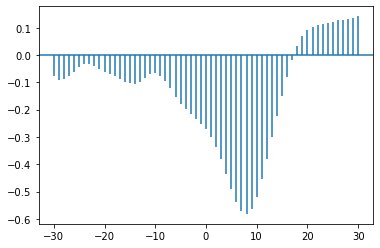

In [39]:
plt.xcorr(dfc.positive_rate, dfc.avg_predict, usevlines=1, maxlags=30)

<AxesSubplot:>

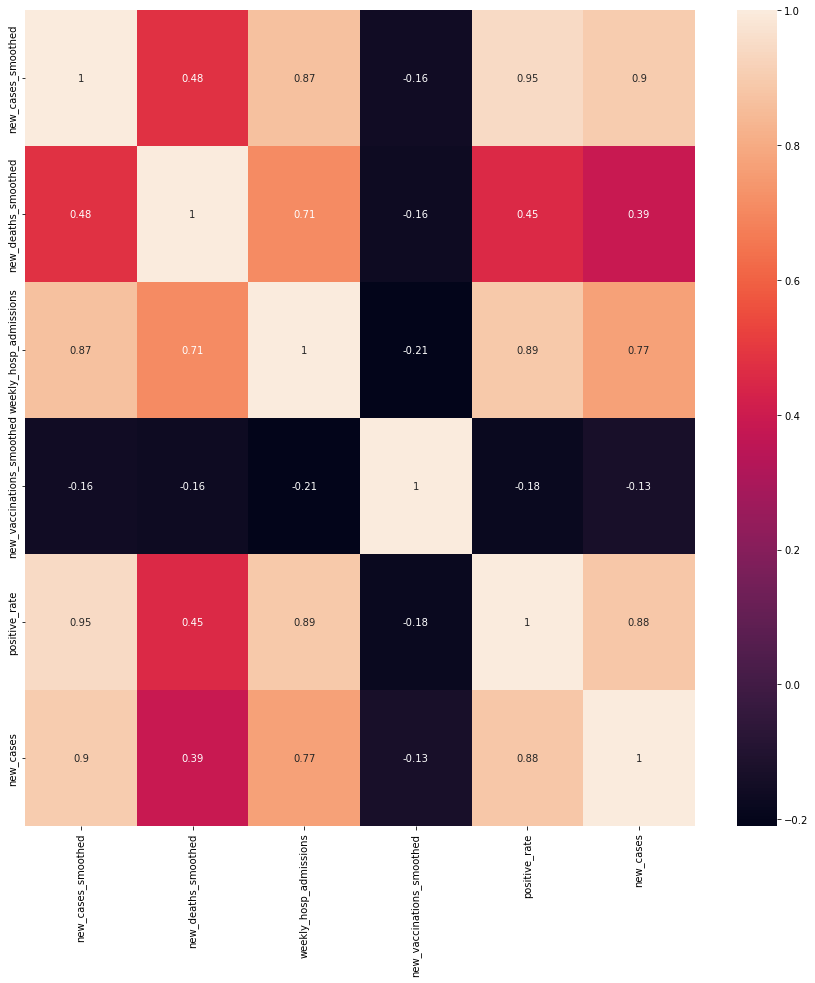

In [40]:
plt.figure(figsize=(15,15))
sns.heatmap(us_df.corr(), annot=True)

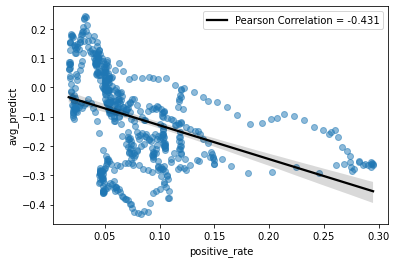

In [41]:
g_label = stats.pearsonr(df_corr.positive_rate, df_corr.avg_predict)
sns.regplot(x='positive_rate', y='avg_predict', data=df_corr, scatter_kws={'alpha':0.50}, line_kws={'color': 'k', 'label':f'Pearson Correlation = {round(g_label[0],3)}'})
plt.legend()

/opt/homebrew/Caskroom/miniforge/base/envs/covid/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='new_deaths_smoothed', ylabel='prediction'>

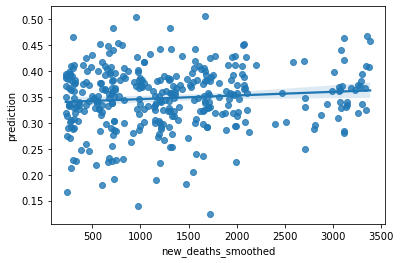

In [42]:
sns.regplot(reg_df.new_deaths_smoothed, reg_df['prediction'].sample(frac=1), )

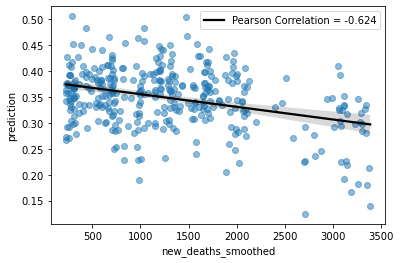

In [43]:
g_label = stats.pearsonr(non_na_df.positive_rate, non_na_df.avg_predict)
sns.regplot(x='new_deaths_smoothed', y='prediction', data=reg_df, scatter_kws={'alpha':0.50}, line_kws={'color': 'k', 'label':f'Pearson Correlation = {round(g_label[0],3)}'})
plt.legend()

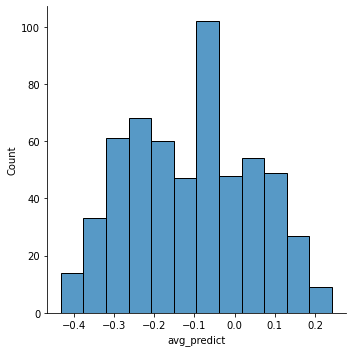

In [44]:
sns.displot(df.avg_predict)

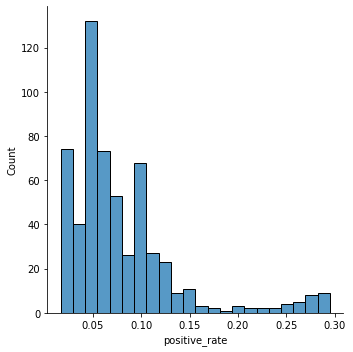

In [45]:
sns.displot(df.positive_rate)

### Plotting the data

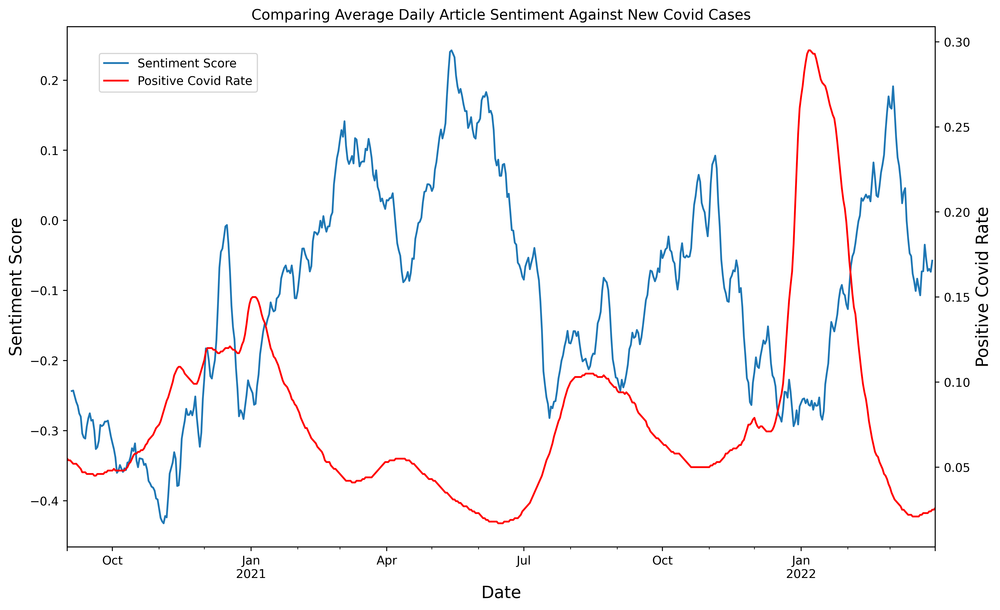

In [93]:
plt.rcParams["figure.dpi"] = 500

ax = df.plot(x="date", y="avg_predict", legend=False, figsize=(13,8), label='Sentiment Score')
ax2 = ax.twinx()
df.plot(x="date", y="positive_rate", ax=ax2, legend=False, color="r", label='Positive Covid Rate')

ax.figure.legend(bbox_to_anchor=(0.3, 0.85))
plt.title('Comparing Average Daily Article Sentiment Against New Covid Cases')
ax.set_ylabel('Sentiment Score', fontsize=14)
ax2.set_ylabel('Positive Covid Rate', fontsize=14)
ax.set_xlabel('Date', fontsize=14)

plt.savefig('figures/pos_rate_compar_entire_timeline.png')

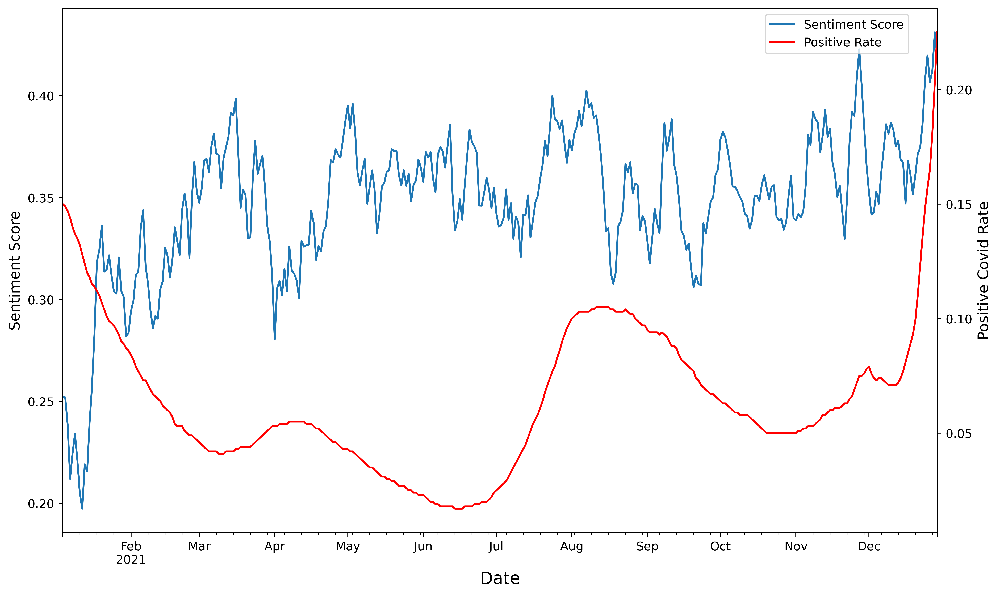

In [96]:
plt.rcParams["figure.dpi"] = 500

ax = reg_df.plot(x="date", y="avg_predict", legend=False, figsize=(13,8), label='Sentiment Score')
ax2 = ax.twinx()
reg_df.plot(x="date", y="positive_rate", ax=ax2, legend=False, color="r", label = 'Positive Rate')

ax.figure.legend(bbox_to_anchor=(0.88, 0.88))
# plt.title('Daily Articles Published vs. Positive Rate')
ax.set_ylabel('Sentiment Score', fontsize=12)
ax2.set_ylabel('Positive Covid Rate', fontsize=12)
ax.set_xlabel('Date', fontsize=14)

plt.savefig('figures/regular_news_trend.png')

In [47]:
# # plt.rcParams["figure.dpi"] = 500

# ax = df.plot(x="date", y="avg_predict", legend=False, figsize=(13,8), label='Sentiment Score')
# ax2 = ax.twinx()
# df.plot(x="date", y="new_vaccinations_smoothed", ax=ax2, legend=False, color="r", label = 'New Vaccines Administered')

# ax.figure.legend(bbox_to_anchor=(0.88, 0.88))
# plt.title('Comparing Average Daily Article Sentiment Against Vaccination Rate')
# ax.set_ylabel('Article Sentiment Score', fontsize=14)
# ax2.set_ylabel('Positive Covid Rate', fontsize=14)
# ax.set_xlabel('Date', fontsize=14)

# plt.savefig('figures/vaccine_compar_entire_timeline.png')

In [98]:
daily_articles['smooth_num_articles'] = daily_articles.num_articles.rolling(window=4, center=True).mean()
stats.pearsonr(daily_articles.smooth_num_articles[2:-1], daily_articles.positive_rate[2:-1])

(0.3643486788828485, 1.8450279275757521e-19)

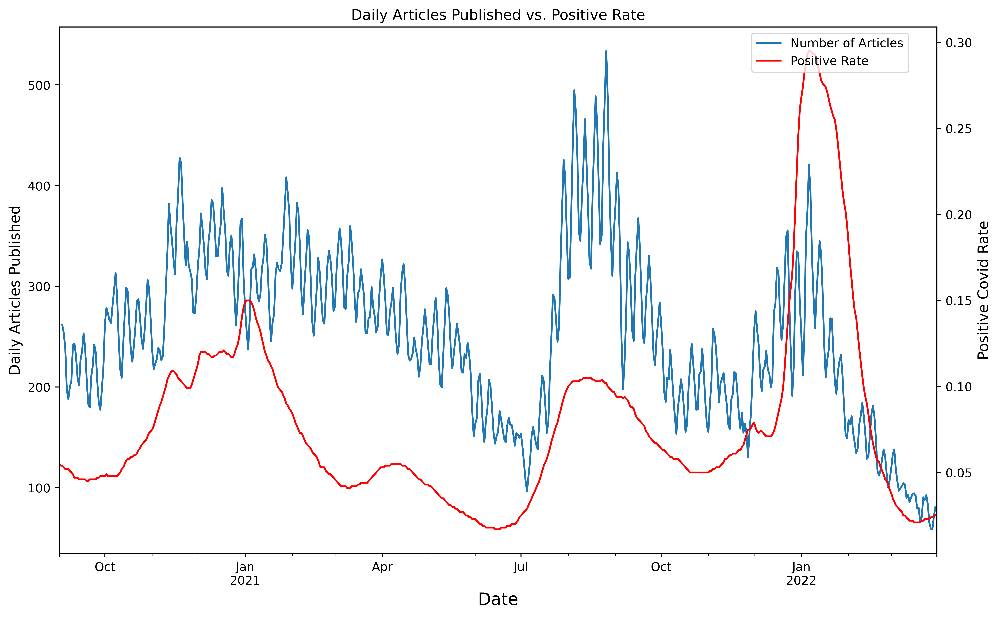

In [99]:
plt.rcParams["figure.dpi"] = 500

ax = daily_articles.plot(x="date", y="smooth_num_articles", legend=False, figsize=(13,8), label='Number of Articles')
ax2 = ax.twinx()
daily_articles.plot(x="date", y="positive_rate", ax=ax2, legend=False, color="r", label = 'Positive Rate')

ax.figure.legend(bbox_to_anchor=(0.88, 0.88))
plt.title('Daily Articles Published vs. Positive Rate')
ax.set_ylabel('Daily Articles Published', fontsize=12)
ax2.set_ylabel('Positive Covid Rate', fontsize=12)
ax.set_xlabel('Date', fontsize=14)

plt.savefig('figures/num_of_articles_vs_pos_rate.png')

### Double check the timeline parts

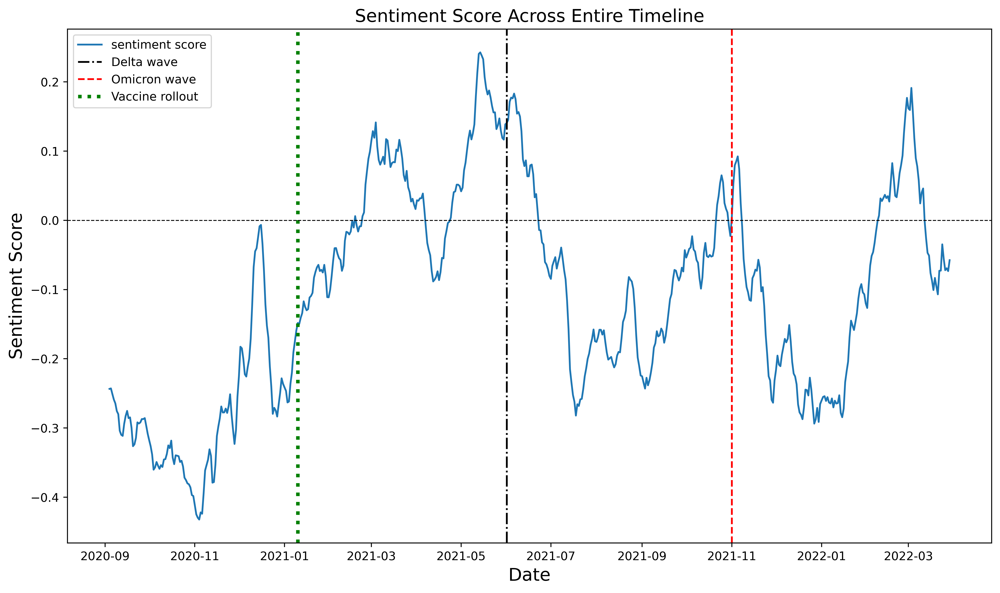

In [50]:
plt.figure(figsize=(14,8))
sns.lineplot(data=df, x='date', y='avg_predict', label='sentiment score')
plt.ylabel('Sentiment Score',fontsize=15)
plt.xlabel('Date', fontsize=15)
plt.title('Sentiment Score Across Entire Timeline',fontsize=15)
plt.axvline(x=pd.to_datetime('2021-06-01'), color='k', linestyle='-.',linewidth=1.5, label='Delta wave')
plt.axvline(x=pd.to_datetime('2021-11-01'), color='r', linestyle='--',linewidth=1.5, label='Omicron wave')
plt.axvline(x=pd.to_datetime('2021-01-10'), color='g', linestyle=':',linewidth=3, label='Vaccine rollout')
plt.axhline(y=0, color='k', linestyle='--', linewidth=0.75)
plt.legend(loc='upper left')
plt.savefig('figures/sentiment_entire_timeline_3hlines.png')

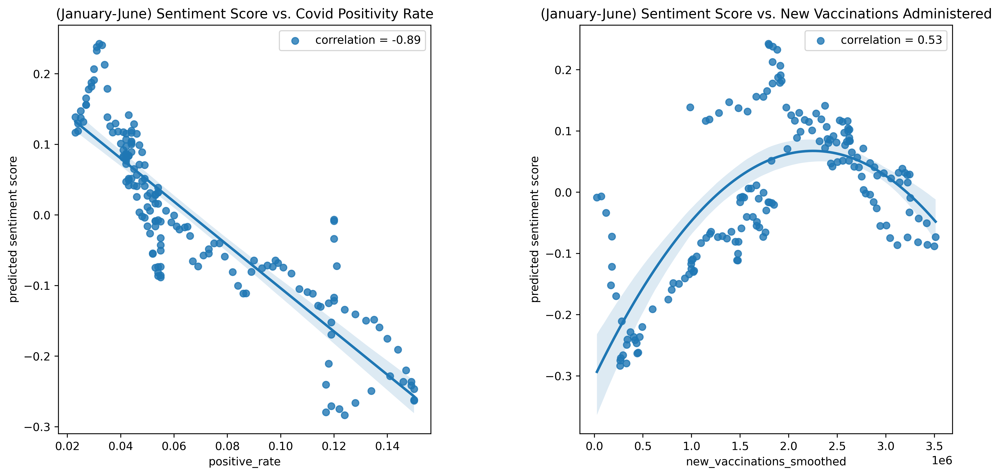

In [51]:
fig, axs = plt.subplots(ncols=2, figsize=(12,6))
sns.regplot(x=pre_delta.positive_rate, y=pre_delta.avg_predict, ax=axs[0], label=f"correlation = {pre_delta_df.loc['positive_rate']['Pearson Correlation']}");
axs[0].set_title('(January-June) Sentiment Score vs. Covid Positivity Rate');
axs[0].set_ylabel('predicted sentiment score');
axs[0].legend()

sns.regplot(x=pre_delta.new_vaccinations_smoothed, y=pre_delta.avg_predict, ax=axs[1], order=2, 
                            label=f"correlation = {pre_delta_df.loc['new_vaccinations_smoothed'].max()}");
axs[1].set_title('(January-June) Sentiment Score vs. New Vaccinations Administered');
axs[1].set_ylabel('predicted sentiment score');
plt.tight_layout()
plt.subplots_adjust(wspace=0.4, hspace=None)
axs[1].legend()
plt.savefig('figures/pre-delt_corr_vaccines & pos_rate.png')

## Isolating for specific correlation timelines

In [52]:
overall_mean = df.prediction.mean()
print(f'average score across the entire timeline: {round(overall_mean,3)}')

def percent_change(avg):
    if avg > overall_mean:
        return np.around(((overall_mean - avg)/ overall_mean) * 100, 1)
    else:
        return np.around(((avg - overall_mean) / overall_mean) * -100, 1)

average_sentiment = []
percent_change_avg = []

average score across the entire timeline: -0.106


Rereading the data in to reset the changes made from before

In [53]:
us_df = pd.read_csv('csv/us_cleaned_health_data.csv')
pre_df = pd.read_csv('csv/NS_sep-dec2020.csv')
df = pd.read_csv('csv/NS_jan-dec2021.csv')
post_df = pd.read_csv('csv/NS_jan2022-mar2022.csv')
daily_articles = pd.read_csv('csv/num_daily_articles.csv')
df = pd.concat((pre_df, df, post_df),axis=0)

df.date = pd.to_datetime(df.date)
us_df.date = pd.to_datetime(us_df.date)
us_df = us_df[(us_df.date >= df.date.min()) & (us_df.date <= df.date.max())]
us_df = us_df[['new_cases_smoothed', 'new_deaths_smoothed', 'weekly_hosp_admissions', 'new_vaccinations_smoothed', 
                'positive_rate', 'new_cases', 'date']]

post_df.date = pd.to_datetime(post_df.date)
post_df = post_df.merge(us_df, on='date')
daily_articles.date = pd.to_datetime(daily_articles.date)
df = df.merge(us_df, on='date')
df['avg_predict'] = df.prediction.rolling(window=6, center=True).mean()
daily_articles = daily_articles.merge(df, on='date')
daily_articles.rename({'article_id': 'num_articles'},axis=1, inplace=True)
df = pd.concat((df, daily_articles.num_articles), axis=1)

In [54]:
non_na_preds = df.drop('new_vaccinations_smoothed',axis=1).columns[4:]

In [55]:
# plt.figure(figsize=(10,7))
# sns.lineplot(data=df, x='date', y='positive_rate')
# plt.title('simple plot to visualize the positive covid rate');

In [56]:
# peak = '2021-09-01'
# sharp_decrease_df = df[(df.date <= peak)& (df.date >= '2021-07-01')]

# plt.figure(figsize=(10,7))
# sns.lineplot(data=sharp_decrease_df, x='date', y='positive_rate')
# # plt.title('(4) Sharp Decrease in Covid Cases (After Omicron)')
# plt.ylabel('Positive Rate')
# plt.xticks(rotation=45)
# plt.tight_layout()
# plt.savefig('figures/(4) Sharp Decrease in Covid Cases (After Omicron).png');

# sd_avg = sharp_decrease_df.prediction.mean()
# print(f'The average sentiment score during the sharp decrease  in cases: {round(sd_avg,3)}')
# print(f'percent change from the average: {percent_change(sd_avg)}%')

# timeline_sharp_dec = daily_articles[(daily_articles.date <= peak) & (daily_articles.date >= '2021-07-01')]

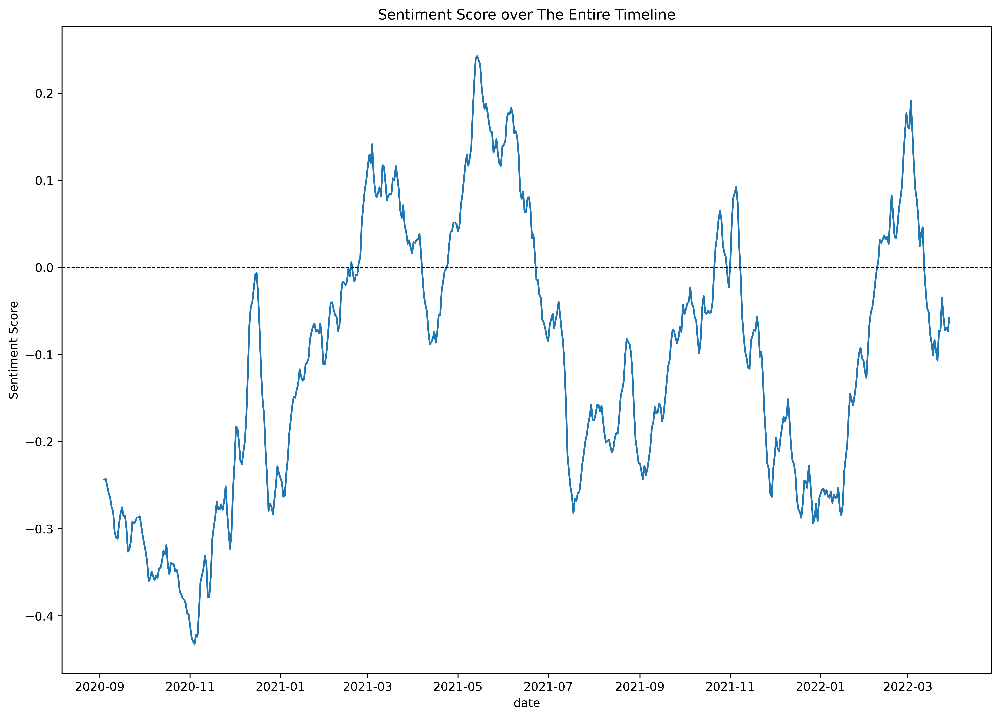

In [57]:
plt.figure(figsize=(14,10))
sns.lineplot(data=df, x='date', y='avg_predict')
plt.axhline(y=0, color='k', linestyle='--', linewidth=0.75)
plt.title('Sentiment Score over The Entire Timeline')
plt.ylabel('Sentiment Score');

In [58]:
max_case = df[df.date < '2022-03-01'].positive_rate.argmax()
min_case = df[df.date < '2021-03-31'].positive_rate.argmin() # Finds the index of the peak or minimum.
df.iloc[max_case]

Unnamed: 0                                     5
date                         2022-01-06 00:00:00
prediction                             -0.325462
weighted_prediction                    -0.324847
new_cases_smoothed                    620422.143
new_deaths_smoothed                       1410.0
weekly_hosp_admissions                  127763.0
new_vaccinations_smoothed               956614.0
positive_rate                              0.295
new_cases                               835016.0
avg_predict                            -0.263098
num_articles                                 392
Name: 492, dtype: object

**Slow Decline in Cases**

In [59]:
# peak = '2021-01-02'
# # long_decrease_df = df[(df.date >= peak )& (df.date <= '2021-6-20')]
# long_decrease_df = df[(df.date >= peak )& (df.date <= '2021-6-20')]
# plt.figure(figsize=(10,7))
# sns.lineplot(data=long_decrease_df, x='date', y='positive_rate');
# plt.title('(1) Slow Decline in Covid Cases')
# plt.ylabel('Positive Rate')
# plt.xticks(rotation=45)
# ld_avg = long_decrease_df.prediction.mean()
# print(f'The average sentiment score during the long decrease in cases: {round(ld_avg,3)}')
# print(f'percent change from the average: {percent_change(ld_avg)}%')
# average_sentiment.append(ld_avg)
# percent_change_avg.append(percent_change(ld_avg))

# plt.savefig('figures/(1) Slow Decline in Covid Cases')

# timeline_slow_dec = daily_articles[(daily_articles.date >= peak )& (daily_articles.date <= '2021-3-10')]

The average sentiment score during the long decrease in cases: -0.032
percent change from the average: 70.0%


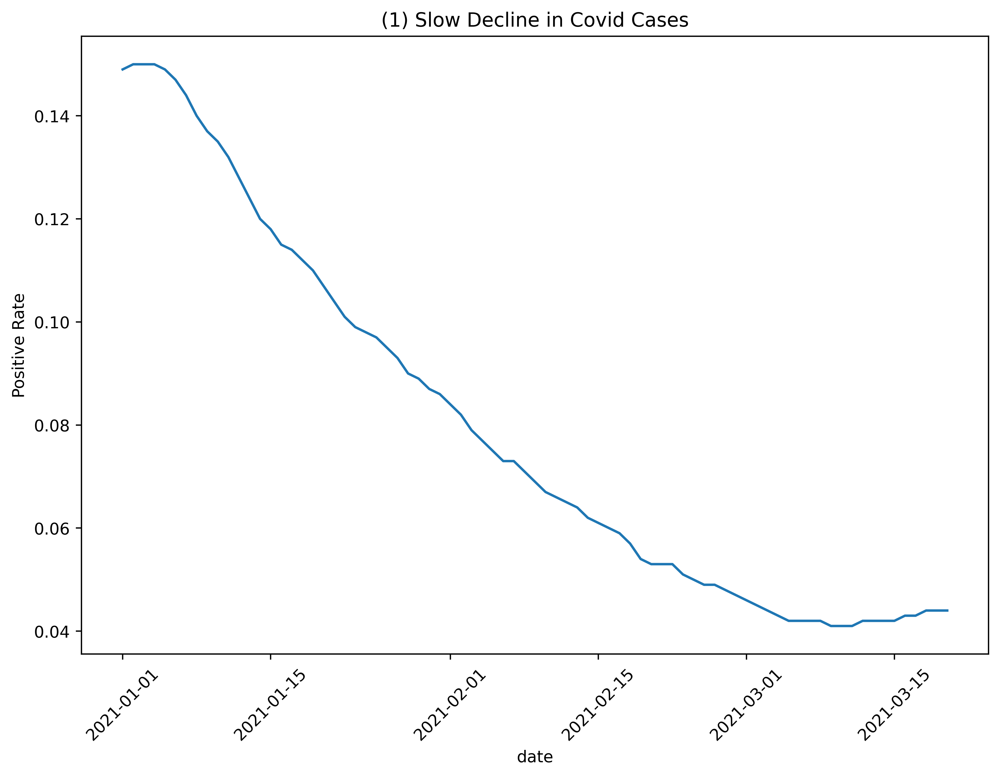

In [60]:
peak = '2021-01-01'
# long_decrease_df = df[(df.date >= peak )& (df.date <= '2021-6-20')]
long_decrease_df = df[(df.date >= peak )& (df.date <= '2021-3-20')]
plt.figure(figsize=(10,7))
sns.lineplot(data=long_decrease_df, x='date', y='positive_rate');
plt.title('(1) Slow Decline in Covid Cases')
plt.ylabel('Positive Rate')
plt.xticks(rotation=45)
ld_avg = long_decrease_df.prediction.mean()
print(f'The average sentiment score during the long decrease in cases: {round(ld_avg,3)}')
print(f'percent change from the average: {percent_change(ld_avg)}%')
average_sentiment.append(ld_avg)
percent_change_avg.append(percent_change(ld_avg))

# plt.savefig('figures/(1) Slow Decline in Covid Cases')

timeline_slow_dec = daily_articles[(daily_articles.date >= peak )& (daily_articles.date <= '2021-3-10')]

The average sentiment score during the long increase in cases: -0.371
percent change from the average: -250.4%


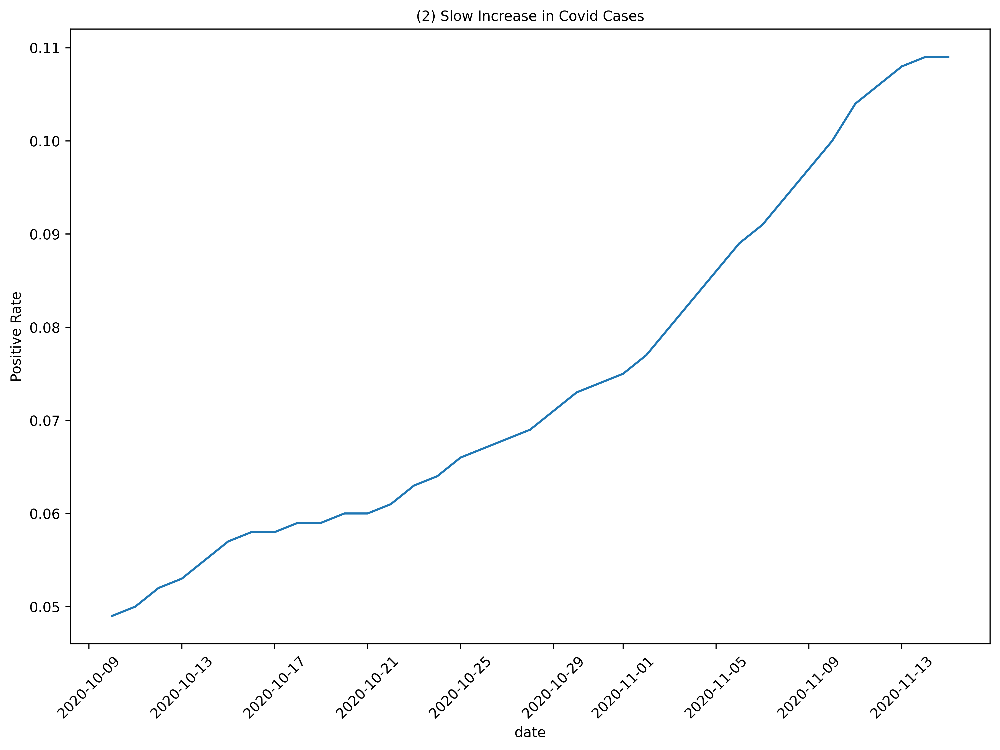

In [61]:
long_increase_df = df[(df.date >= '2020-10-10') & (df.date <= '2020-11-15')]
plt.figure(figsize=(10,7))
sns.lineplot(data=long_increase_df, x='date', y='positive_rate')
plt.title('(2) Slow Increase in Covid Cases', fontsize=10)
plt.ylabel('Positive Rate', fontsize=10)
plt.tight_layout()
plt.xticks(rotation=45)

li_mean = long_increase_df.prediction.mean()
print(f'The average sentiment score during the long increase in cases: {round(li_mean,3)}')
print(f'percent change from the average: {percent_change(li_mean)}%')
average_sentiment.append(li_mean)
percent_change_avg.append(percent_change(li_mean))

# plt.savefig('figures/(2) Slow Increase in Covid Cases')

The average sentiment score during the long increase in cases: 0.027
percent change from the average: 125.6%


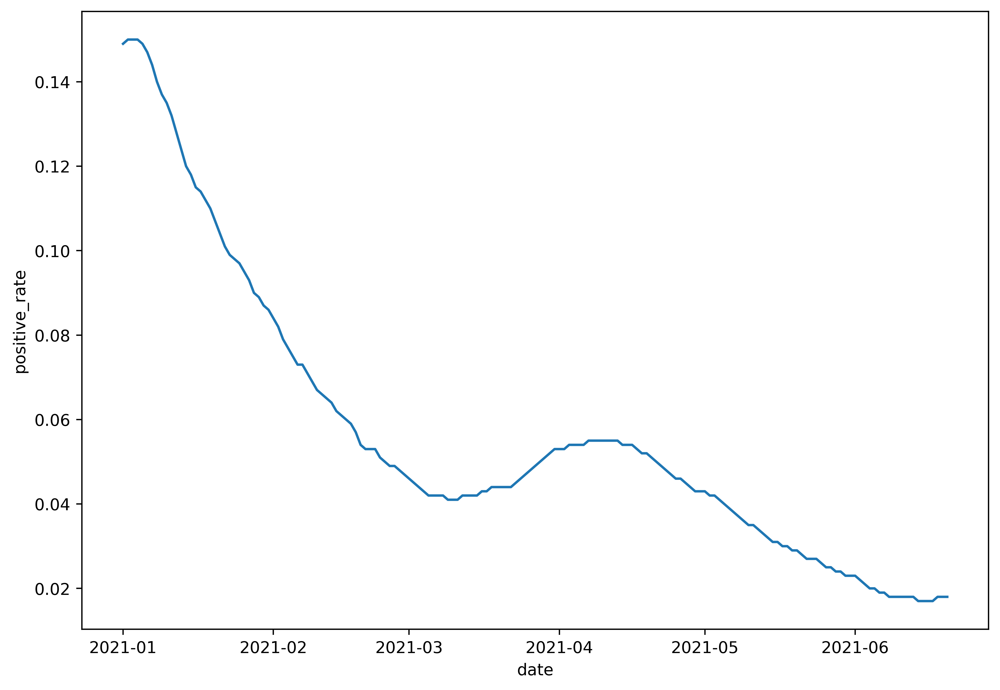

In [62]:
delta_decrease_df = df[(df.date >= '2021-01-01') & (df.date <= '2021-06-20')]
plt.figure(figsize=(10,7))
sns.lineplot(data=delta_decrease_df, x='date', y='positive_rate')
li_mean = delta_decrease_df.prediction.mean()
print(f'The average sentiment score during the long increase in cases: {round(li_mean,3)}')
print(f'percent change from the average: {percent_change(li_mean)}%')

The average sentiment score during the sharp increase  in cases: -0.272
percent change from the average: -156.4%


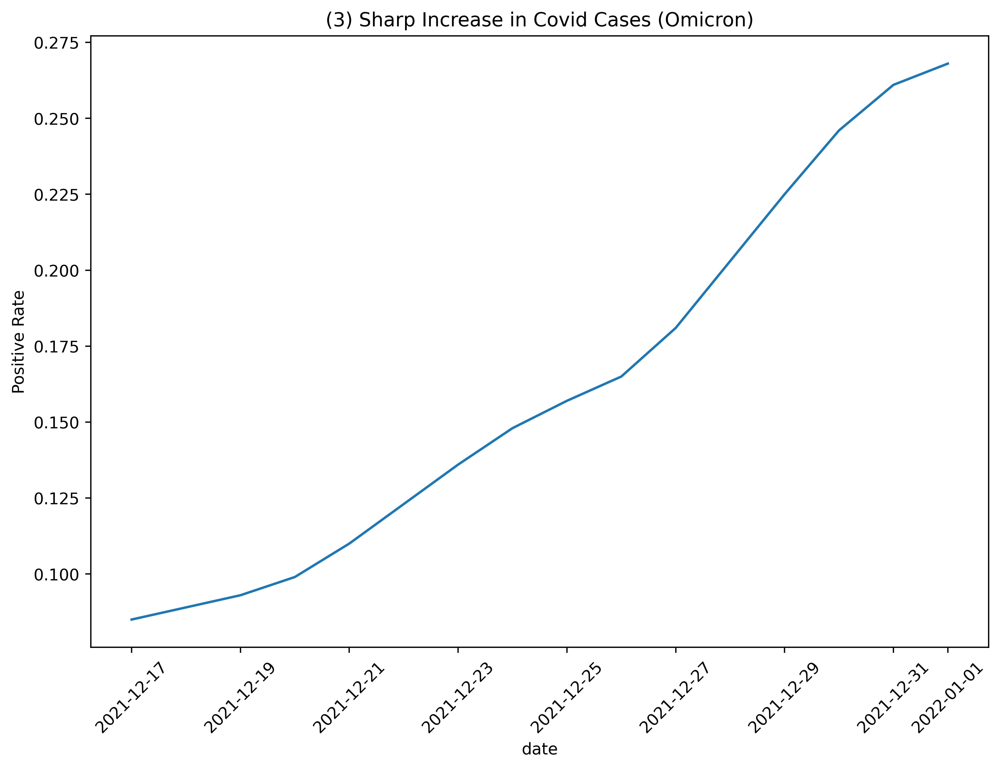

In [63]:
peak = '2022-01-01'
sharp_increase_df = df[(df.date <= peak) & (df.date >= '2021-12-17')]
plt.figure(figsize=(10,7))
sns.lineplot(data=sharp_increase_df, x='date', y='positive_rate')
plt.title('(3) Sharp Increase in Covid Cases (Omicron)')
plt.ylabel('Positive Rate')
plt.xticks(rotation=45)

si_avg = sharp_increase_df.prediction.mean()
print(f'The average sentiment score during the sharp increase  in cases: {round(si_avg,3)}')
print(f'percent change from the average: {percent_change(si_avg)}%')
average_sentiment.append(si_avg)
percent_change_avg.append(percent_change(si_avg))

# plt.savefig('figures/(3) Sharp Increase in Covid Cases (Omicron)')

In [64]:
sharp_increase_df['date_ordinal'] = pd.to_datetime(sharp_increase_df['date']).apply(lambda date: date.toordinal())
long_increase_df['date_ordinal'] = pd.to_datetime(long_increase_df['date']).apply(lambda date: date.toordinal())

Text(0.5, 1.0, 'Sentiment Score During Slow Decreasing Covid Cases')

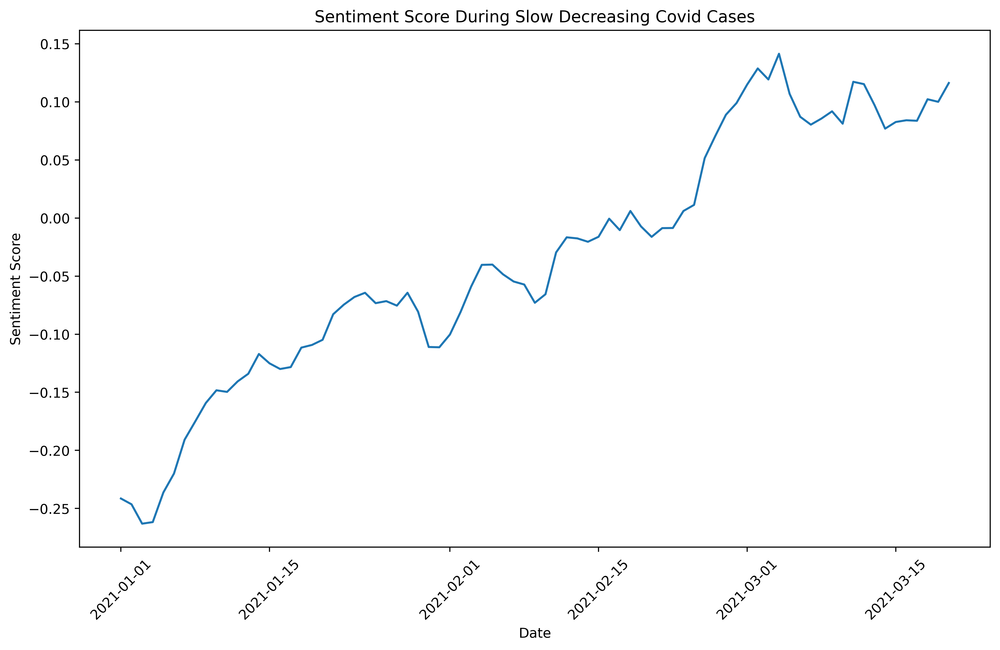

In [65]:
plt.figure(figsize=(12,7))
sns.lineplot(data=long_decrease_df, x='date', y='avg_predict');
plt.ylabel('Sentiment Score')
plt.xlabel('Date')
plt.xticks(rotation=45)
plt.title('Sentiment Score During Slow Decreasing Covid Cases')

The average sentiment score during the sharp decrease  in cases: -0.033
percent change from the average: 68.7%


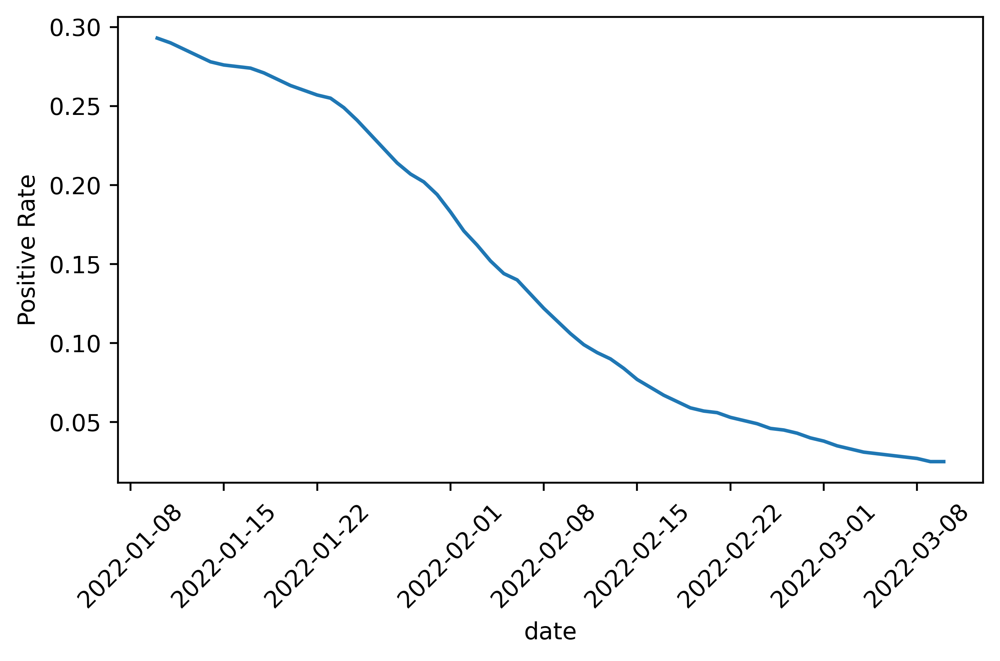

In [66]:
peak = '2022-01-10'
sharp_decrease_df = df[(df.date >= peak)& (df.date <= '2022-03-10')]

# plt.figure(figsize=(10,7))
sns.lineplot(data=sharp_decrease_df, x='date', y='positive_rate')
# plt.title('(4) Sharp Decrease in Covid Cases (After Omicron)')
plt.ylabel('Positive Rate')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('figures/(4) Sharp Decrease in Covid Cases (After Omicron).png');

sd_avg =sharp_decrease_df.prediction.mean()
print(f'The average sentiment score during the sharp decrease  in cases: {round(sd_avg,3)}')
print(f'percent change from the average: {percent_change(sd_avg)}%')
average_sentiment.append(sd_avg)
percent_change_avg.append(percent_change(sd_avg))

In [67]:
from datetime import date
long_decrease_df['date_ordinal'] = pd.to_datetime(long_decrease_df['date']).apply(lambda date: date.toordinal())
sharp_decrease_df['date_ordinal'] = pd.to_datetime(sharp_decrease_df['date']).apply(lambda date: date.toordinal())

/var/folders/7b/prbmv40d5wg4ymrn9dr3c76c0000gn/T/ipykernel_25905/3223559360.py:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(new_labels)
/var/folders/7b/prbmv40d5wg4ymrn9dr3c76c0000gn/T/ipykernel_25905/3223559360.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(new_labels)


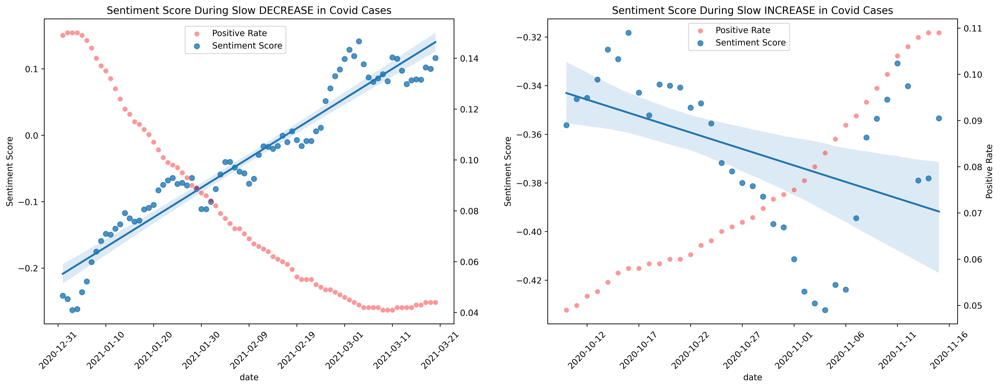

In [68]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(17,7))

ax1 = sns.regplot(data=long_decrease_df, x='date_ordinal', y='avg_predict', ax=ax1, label='Sentiment Score')
ax1.set_ylabel('Sentiment Score')
ax1.set_xlabel('date')
new_labels = [date.fromordinal(int(item)) for item in ax1.get_xticks()]
ax1.set_xticklabels(new_labels)
ax1.set_title('Sentiment Score During Slow DECREASE in Covid Cases')

ax3 = ax1.twinx()
ax3 = sns.scatterplot(data=long_decrease_df, x='date_ordinal', y='positive_rate', ax=ax3, color='r', alpha=0.4, label='Positive Rate', legend=False)
ax3.set_ylabel('')
lines, labels = ax3.get_legend_handles_labels()
lines2, labels2 = ax1.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, bbox_to_anchor=(0.6, 0.99))

ax2 = sns.regplot(data=long_increase_df, x='date_ordinal', y='avg_predict', ax=ax2, label='Sentiment Score');
ax2.set_xlabel('date')
new_labels = [date.fromordinal(int(item)) for item in ax2.get_xticks()]
ax2.set_xticklabels(new_labels)
ax2.set_ylabel('Sentiment Score')
ax2.set_title('Sentiment Score During Slow INCREASE in Covid Cases');
ax4 = ax2.twinx()
ax4 = sns.scatterplot(data=long_increase_df, x='date_ordinal', y='positive_rate', ax=ax4, color='r', alpha=0.4, label='Positive Rate', legend=False)
ax4.set_ylabel('Positive Rate')

lines3, labels = ax2.get_legend_handles_labels()
lines4, labels2 = ax4.get_legend_handles_labels()
ax2.legend(lines4 + lines3, labels2 + labels, bbox_to_anchor=(0.6, 1))

for ax in f.axes:
    plt.sca(ax);
    plt.xticks(rotation=45);
plt.tight_layout(pad=3.0);
f.savefig('figures/slow increase and decrease in cases regplot.png');

/var/folders/7b/prbmv40d5wg4ymrn9dr3c76c0000gn/T/ipykernel_25905/3444828293.py:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(new_labels)
/var/folders/7b/prbmv40d5wg4ymrn9dr3c76c0000gn/T/ipykernel_25905/3444828293.py:19: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(new_labels)


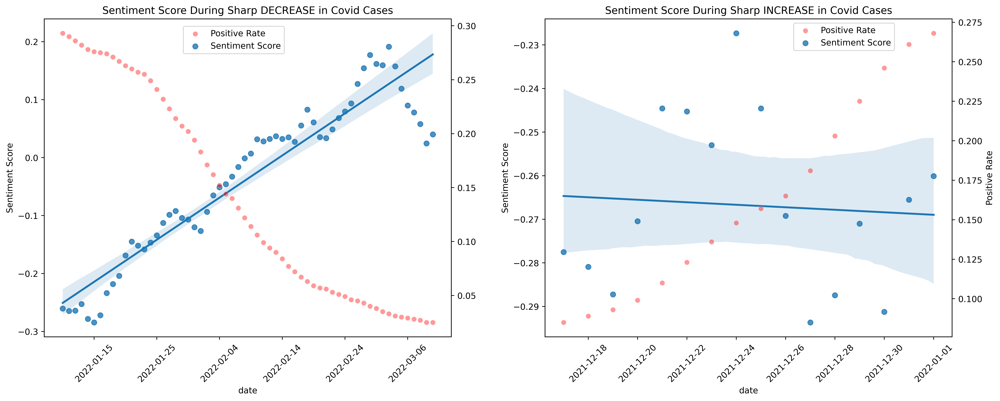

In [69]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(17,7))

ax1 = sns.regplot(data=sharp_decrease_df, x='date_ordinal', y='avg_predict', ax=ax1, label='Sentiment Score')
ax1.set_ylabel('Sentiment Score')
ax1.set_xlabel('date')
new_labels = [date.fromordinal(int(item)) for item in ax1.get_xticks()]
ax1.set_xticklabels(new_labels)

ax3 = ax1.twinx()
ax3 = sns.scatterplot(data=sharp_decrease_df, x='date_ordinal', y='positive_rate', ax=ax3, color='r', alpha=0.4, label='Positive Rate', legend=False)
ax3.set_ylabel('')
lines, labels = ax3.get_legend_handles_labels()
lines2, labels2 = ax1.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, bbox_to_anchor=(0.6, 0.99))

ax2 = sns.regplot(data=sharp_increase_df, x='date_ordinal', y='avg_predict', ax=ax2, label='Sentiment Score');
ax2.set_xlabel('date')
new_labels = [date.fromordinal(int(item)) for item in ax2.get_xticks()]
ax2.set_xticklabels(new_labels)
ax2.set_ylabel('Sentiment Score')
ax4 = ax2.twinx()
ax4 = sns.scatterplot(data=sharp_increase_df, x='date_ordinal', y='positive_rate', ax=ax4, color='r', alpha=0.4, label='Positive Rate', legend=False)
ax4.set_ylabel('Positive Rate')

lines3, labels = ax2.get_legend_handles_labels()
lines4, labels2 = ax4.get_legend_handles_labels()
ax2.legend(lines4 + lines3, labels2 + labels, bbox_to_anchor=(0.6, 1))

for ax in f.axes:
    plt.sca(ax);
    plt.xticks(rotation=45);
plt.tight_layout(pad=3.0);

ax1.set_title('Sentiment Score During Sharp DECREASE in Covid Cases')
ax2.set_title('Sentiment Score During Sharp INCREASE in Covid Cases');
f.savefig('figures/sharp increase and decrease regplot.png');

In [70]:
sentim_anal = pd.DataFrame({'Average Sentiment':average_sentiment, 'Percent Change': percent_change_avg})
sentim_anal = sentim_anal.round(2)
sentim_anal['Percent Change'] = sentim_anal['Percent Change'].apply(lambda x: str(x)+'%')
sentim_anal.index = ['(1) Slow  Decrease', '(2) Sharp Decrease' , '(3) Slow  Increase', '(4) Sharp Increase']
sentim_anal.index.name = 'Change in Covid Cases'
slow_inc, sharp_inc, sharp_dec = sentim_anal.iloc[1].copy(), sentim_anal.iloc[2].copy(), sentim_anal.iloc[3].copy()
sentim_anal.iloc[1] = sharp_dec
sentim_anal.iloc[2] = slow_inc
sentim_anal.iloc[3] = sharp_inc
sentim_anal

,Average Sentiment,Percent Change
Change in Covid Cases,,
(1) Slow Decrease,-0.03,70.0%
(2) Sharp Decrease,-0.03,68.7%
(3) Slow Increase,-0.37,-250.4%
(4) Sharp Increase,-0.27,-156.4%


In [71]:
sentim_anal.to_latex('latex_tables/percent_change_avg_sentim.tex')

/var/folders/7b/prbmv40d5wg4ymrn9dr3c76c0000gn/T/ipykernel_25905/2074057831.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  sentim_anal.to_latex('latex_tables/percent_change_avg_sentim.tex')


**Long Decrease**

In [72]:
ld_pearson_corr = []
ld_pearson_p_val = []
for predictor in predictor_list:
    corr, p_val = calc_corr(dataframe=long_decrease_df, predictor=predictor)
    ld_pearson_corr.append(corr)
    ld_pearson_p_val.append(p_val)

ld_spearman_corr = []
ld_spearman_p_val = []
for predictor in predictor_list:
    corr, p_val = calc_corr(dataframe=long_decrease_df, predictor=predictor, spearman=True)
    ld_spearman_corr.append(corr)
    ld_spearman_p_val.append(p_val)

ld_kendal_corr = []
ld_kendal_p_val = []
for predictor in predictor_list:
    corr, p_val = calc_corr(dataframe=long_decrease_df,predictor=predictor, kend=True)
    ld_kendal_corr.append(corr)
    ld_kendal_p_val.append(p_val)

ld_analysis_df = pd.DataFrame({'Pearson Correlation' : ld_pearson_corr,'Spearman Correlation' : ld_spearman_corr, 'Kendall Correlation' : ld_kendal_corr})
ld_p_val_df = pd.DataFrame({'Pearson p-value': ld_pearson_p_val, 'Spearman p-value': ld_spearman_p_val, 'Kendall p-value': ld_kendal_p_val})
ld_analysis_df.index = predictor_list
ld_p_val_df.index = predictor_list

In [73]:
ld_analysis_df

,Pearson Correlation,Spearman Correlation,Kendall Correlation
new_cases,-0.861,-0.892,-0.685
new_cases_smoothed,-0.903,-0.936,-0.765
new_deaths_smoothed,-0.788,-0.808,-0.604
weekly_hosp_admissions,-0.930,-0.952,-0.806
new_vaccinations_smoothed,0.958,0.932,0.773
positive_rate,-0.948,-0.958,-0.844


In [74]:
ld_pearson_corr = []
ld_pearson_p_val = []
for predictor in predictor_list:
    corr, p_val = calc_corr(dataframe=delta_decrease_df, predictor=predictor)
    ld_pearson_corr.append(corr)
    ld_pearson_p_val.append(p_val)

ld_spearman_corr = []
ld_spearman_p_val = []
for predictor in predictor_list:
    corr, p_val = calc_corr(dataframe=delta_decrease_df, predictor=predictor, spearman=True)
    ld_spearman_corr.append(corr)
    ld_spearman_p_val.append(p_val)

ld_kendal_corr = []
ld_kendal_p_val = []
for predictor in predictor_list:
    corr, p_val = calc_corr(dataframe=delta_decrease_df,predictor=predictor, kend=True)
    ld_kendal_corr.append(corr)
    ld_kendal_p_val.append(p_val)

ld_analysis_df = pd.DataFrame({'Pearson Correlation' : ld_pearson_corr,'Spearman Correlation' : ld_spearman_corr, 'Kendall Correlation' : ld_kendal_corr})
ld_p_val_df = pd.DataFrame({'Pearson p-value': ld_pearson_p_val, 'Spearman p-value': ld_spearman_p_val, 'Kendall p-value': ld_kendal_p_val})
ld_analysis_df.index = predictor_list
ld_p_val_df.index = predictor_list

In [75]:
ld_analysis_df

,Pearson Correlation,Spearman Correlation,Kendall Correlation
new_cases,-0.830,-0.831,-0.634
new_cases_smoothed,-0.853,-0.876,-0.693
new_deaths_smoothed,-0.729,-0.739,-0.533
weekly_hosp_admissions,-0.852,-0.871,-0.700
new_vaccinations_smoothed,0.196,0.131,0.059
positive_rate,-0.885,-0.905,-0.745


**Long Increase + Vaccines**

In [76]:
li_pearson_corr = []
li_pearson_p_val = []
for predictor in non_na_preds[:-2]:
    corr, p_val = calc_corr(dataframe=long_increase_df, predictor=predictor)
    li_pearson_corr.append(corr)
    li_pearson_p_val.append(p_val)

li_spearman_corr = []
li_spearman_p_val = []
for predictor in non_na_preds[:-2]:
    corr, p_val = calc_corr(dataframe=long_increase_df, predictor=predictor, spearman=True)
    li_spearman_corr.append(corr)
    li_spearman_p_val.append(p_val)

li_kendal_corr = []
li_kendal_p_val = []
for predictor in non_na_preds[:-2]:
    corr, p_val = calc_corr(dataframe=long_increase_df,predictor=predictor, kend=True)
    li_kendal_corr.append(corr)
    li_kendal_p_val.append(p_val)
    
li_analysis_df = pd.DataFrame({'Pearson Correlation' : li_pearson_corr,'Spearman Correlation' : li_spearman_corr, 'Kendall Correlation' : li_kendal_corr})
li_p_val_df = pd.DataFrame({'Pearson p-value': li_pearson_p_val, 'Spearman p-value': li_spearman_p_val, 'Kendall p-value': li_kendal_p_val})
li_analysis_df.index = non_na_preds[:-2]
li_p_val_df.index = non_na_preds[:-2]

In [77]:
li_analysis_df

,Pearson Correlation,Spearman Correlation,Kendall Correlation
new_cases_smoothed,-0.280,-0.475,-0.360
new_deaths_smoothed,-0.315,-0.480,-0.369
weekly_hosp_admissions,-0.275,-0.477,-0.366
positive_rate,-0.306,-0.478,-0.367
new_cases,-0.309,-0.423,-0.276


In [78]:
li_p_val_df

,Pearson p-value,Spearman p-value,Kendall p-value
new_cases_smoothed,0.09490,0.0068,0.0022
new_deaths_smoothed,0.06170,0.0056,0.0011
weekly_hosp_admissions,0.10419,0.0062,0.0011
positive_rate,0.06850,0.0059,0.0012
new_cases,0.06310,0.0198,0.0161


**Sharp Increase Omicron**

In [79]:
si_pearson_corr = []
si_pearson_p_val = []
for predictor in predictor_list:
    corr, p_val = calc_corr(dataframe=sharp_increase_df, predictor=predictor)
    si_pearson_corr.append(corr)
    si_pearson_p_val.append(p_val)

si_spearman_corr = []
si_spearman_p_val = []
for predictor in predictor_list:
    corr, p_val = calc_corr(dataframe=sharp_increase_df, predictor=predictor, spearman=True)
    si_spearman_corr.append(corr)
    si_spearman_p_val.append(p_val)

si_kendal_corr = []
si_kendal_p_val = []
for predictor in predictor_list:
    corr, p_val = calc_corr(dataframe=sharp_increase_df,predictor=predictor, kend=True)
    si_kendal_corr.append(corr)
    si_kendal_p_val.append(p_val)

si_analysis_df = pd.DataFrame({'Pearson Correlation' : si_pearson_corr,'Spearman Correlation' : si_spearman_corr, 'Kendall Correlation' : si_kendal_corr})
si_p_val_df = pd.DataFrame({'Pearson p-value': si_pearson_p_val, 'Spearman p-value': si_spearman_p_val, 'Kendall p-value': si_kendal_p_val})
si_analysis_df.index = predictor_list
si_p_val_df.index = predictor_list

In [80]:
si_analysis_df

,Pearson Correlation,Spearman Correlation,Kendall Correlation
new_cases,-0.352,-0.274,-0.183
new_cases_smoothed,-0.156,-0.056,-0.017
new_deaths_smoothed,0.414,0.371,0.283
weekly_hosp_admissions,-0.169,-0.053,0.000
new_vaccinations_smoothed,0.306,0.435,0.333
positive_rate,-0.128,-0.056,-0.017


In [81]:
si_p_val_df

,Pearson p-value,Spearman p-value,Kendall p-value
new_cases,0.18049,0.60287,0.36038
new_cases_smoothed,0.56777,0.33948,0.96295
new_deaths_smoothed,0.12229,0.31798,0.13999
weekly_hosp_admissions,0.54927,0.31918,1.00000
new_vaccinations_smoothed,0.24849,0.19559,0.07480
positive_rate,0.64397,0.33498,0.95935


**Sharp Decrease Omicron**

In [82]:
sd_pearson_corr = []
sd_pearson_p_val = []
for predictor in predictor_list:
    corr, p_val = calc_corr(dataframe=sharp_decrease_df, predictor=predictor)
    sd_pearson_corr.append(corr)
    sd_pearson_p_val.append(p_val)

sd_spearman_corr = []
sd_spearman_p_val = []
for predictor in predictor_list:
    corr, p_val = calc_corr(dataframe=sharp_decrease_df, predictor=predictor, spearman=True)
    sd_spearman_corr.append(corr)
    sd_spearman_p_val.append(p_val)

sd_kendal_corr = []
sd_kendal_p_val = []
for predictor in predictor_list:
    corr, p_val = calc_corr(dataframe=sharp_decrease_df,predictor=predictor, kend=True)
    sd_kendal_corr.append(corr)
    sd_kendal_p_val.append(p_val)

sd_analysis_df = pd.DataFrame({'Pearson Correlation' : sd_pearson_corr,'Spearman Correlation' : sd_spearman_corr, 'Kendall Correlation' : sd_kendal_corr})
sd_p_val_df = pd.DataFrame({'Pearson p-value': sd_pearson_p_val, 'Spearman p-value': sd_spearman_p_val, 'Kendall p-value': sd_kendal_p_val})
sd_analysis_df.index = predictor_list
sd_p_val_df.index = predictor_list

In [83]:
sd_analysis_df

,Pearson Correlation,Spearman Correlation,Kendall Correlation
new_cases,-0.836,-0.871,-0.673
new_cases_smoothed,-0.954,-0.940,-0.817
new_deaths_smoothed,-0.272,-0.351,-0.195
weekly_hosp_admissions,-0.945,-0.940,-0.819
new_vaccinations_smoothed,-0.959,-0.941,-0.824
positive_rate,-0.959,-0.941,-0.822


In [84]:
sd_p_val_df

,Pearson p-value,Spearman p-value,Kendall p-value
new_cases,0.0001,0.0001,0.0001
new_cases_smoothed,0.0001,0.0001,0.0001
new_deaths_smoothed,0.0317,0.0140,0.0282
weekly_hosp_admissions,0.0001,0.0001,0.0001
new_vaccinations_smoothed,0.0001,0.0001,0.0001
positive_rate,0.0001,0.0001,0.0001


In [85]:
positive_rate_corr = pd.concat((sd_analysis_df.loc['positive_rate'],ld_analysis_df.loc['positive_rate'], 
            li_analysis_df.loc['positive_rate'], si_analysis_df.loc['positive_rate']),axis=1)

positive_rate_corr.columns = ['(1) Slow Decrease', '(2) Sharp Decrease', '(3) Slow Increase', '(4) Sharp Increase']
positive_rate_corr = positive_rate_corr.T


In [86]:
positive_rate_corr.index.name = 'Change in Covid Cases'
positive_rate_corr

,Pearson Correlation,Spearman Correlation,Kendall Correlation
Change in Covid Cases,,,
(1) Slow Decrease,-0.959,-0.941,-0.822
(2) Sharp Decrease,-0.885,-0.905,-0.745
(3) Slow Increase,-0.306,-0.478,-0.367
(4) Sharp Increase,-0.128,-0.056,-0.017


In [87]:
positive_rate_corr.to_latex('latex_tables/positive rate correlations.tex')

/var/folders/7b/prbmv40d5wg4ymrn9dr3c76c0000gn/T/ipykernel_25905/3683922690.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  positive_rate_corr.to_latex('latex_tables/positive rate correlations.tex')


In [88]:
sharp_decrease_df.num_articles.mean()


173.51666666666668

In [89]:
sharp_increase_df.num_articles.mean()

276.5

In [90]:
long_increase_df.num_articles.mean()

267.02702702702703

In [91]:
long_decrease_df.num_articles.mean()

310.45569620253167